<img src="https://www.gisma.com/media/3539/digtal-logo-1-rgb.png" width="200"/>

# Data Science and AI for German Policymakers

## Data Science
- Many aspects of our lives are now rendered into **online data.**
- These **big data** needs to be analyzed.
- **Data scientists** extract **actionable insights** to support decision makers.
- These **decision makers** could range from owners of small businesses to **world leaders.**
- Decision makers can run their businesses more **effectively and efficiently** using data-driven insights.  

## Data Scientists of Gisma
- They collect **online data** from various sources, such as **web** and **social media.** 
- They leverage state-of-the-art **artificial intelligence** and **machine learning** algorithms.
- They work with state-of-the-art **open-source technologies.**
- They **learn concepts by doing.**

## Today's Session
- Our data scientists **present data-driven insights** to **German policymakers.**
- These insights help policymakers **develop future policies** for the **job market.**
    
<center> |||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||| </center>

# Unemployment in Germany
- Data Source: https://www.govdata.de/web/guest/suchen/-/details/arbeitslose-arbeitslosenquoten-gemeldete-arbeitsstellen-bundeslander-jahre

In [1]:
import json
import ipyplot
import warnings
import wordcloud
import nltk.corpus
import pandas as pd
import IPython.display
import geopandas as gpd
import plotly.express as px
import plotly.subplots as ps
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import sklearn.feature_extraction.text
warnings.filterwarnings("ignore")

## How Germany is doing in terms of the unemployment rate?

In [2]:
df = pd.read_csv("https://www-genesis.destatis.de/genesis/downloads/00/tables/13211-0007_00.csv", 
                 delimiter=";", encoding="ISO-8859-1", skiprows=[0, 1, 2, 3, 5])
df = df.rename(columns={"Unnamed: 0": "State", "Unnamed: 1": "Year", 
                        "Arbeitslosenquote aller zivilen Erwerbspersonen": "Unemplyement Rate (%)"})
df = df[df["Year"] >= 2000]
df["Year"] = df["Year"].astype(int)
df["Unemplyement Rate (%)"] = df["Unemplyement Rate (%)"].str.replace(",", ".")
df["Unemplyement Rate (%)"] = df["Unemplyement Rate (%)"].astype(float)

df_2022 = df[df["Year"] == 2022].copy()
germany_geojson = "https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/1_sehr_hoch.geo.json"
gdf = gpd.read_file(germany_geojson)
merged_data = gdf.merge(df_2022, left_on="name", right_on="State", how="left")

fig = px.choropleth(
    merged_data,
    geojson=merged_data["geometry"],
    locations=merged_data.index,
    color="Unemplyement Rate (%)",
    hover_name="State",
    color_continuous_scale="PuRd",
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    title=dict(text=f"While Bayern is doing good,<br>Bremen with a 10% unemployment rate needs immediate action!", 
               font=dict(size=22))
)
fig.show()

## What is different in Bremen and Bayern?

In [3]:
df_bayern = df[df["State"] == "Bayern"]
df_bremen = df[df["State"] == "Bremen"]

fig = ps.make_subplots(rows=1, cols=2, subplot_titles=("Bayern", "Bremen"))
fig.add_trace(go.Scatter(x=df_bayern["Year"], y=df_bayern["Arbeitslose"], mode="lines+markers", name="Job Seekers", 
                         marker_color="gray", line={"color": "lightgray", "width": 4}), row=1, col=1)
fig.add_trace(go.Scatter(x=df_bayern["Year"], y=df_bayern["Gemeldete Arbeitsstellen"], mode="lines+markers", 
                         name="Announced Jobs", marker_color="blue", line={"color": "lightblue", "width": 5}), row=1, col=1)
fig.add_trace(go.Scatter(x=df_bremen["Year"], y=df_bremen["Arbeitslose"], mode="lines+markers", name="Job Seekers", 
                         marker_color="gray", line={"color": "lightgray", "width": 4}, showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=df_bremen["Year"], y=df_bremen["Gemeldete Arbeitsstellen"], mode="lines+markers", 
                         name="Announced Jobs", marker_color="blue", line={"color": "lightblue", "width": 5}, 
                         showlegend=False), row=1, col=2)
fig.update_layout(
    title=dict(text=f"While the gap is being filled in Bayern, we should fill the gap for Bremen!", font=dict(size=25)),
    xaxis_title="Year",
    template="plotly_white",
    legend=dict(yanchor="top", y=1.0, xanchor="left", x=0.3)
)
fig.add_annotation(dict(font=dict(color="red", size=15), x=0.2, y=0.28, showarrow=False,
                                        text="Job Seekers / Jobs = 1.5<br>3 Job Seekers: 2 Jobs",
                                        textangle=0, xanchor="left", xref="paper", yref="paper"))
fig.add_annotation(dict(font=dict(color="red", size=15), x=0.8, y=0.4, showarrow=False,
                                        text="Job Seekers / Jobs = 4.2<br>4 Job Seekers: 1 Job",
                                        textangle=0, xanchor="left", xref="paper", yref="paper"))
fig.show()

## How can we address the job market gap issue in Bremen? 
- Data Source: Linkedin API

### We should address the gap by matching available jobs and job seekers' preferences.


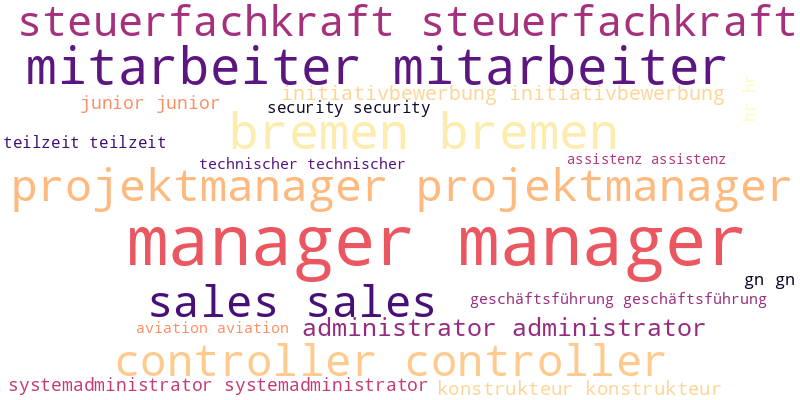
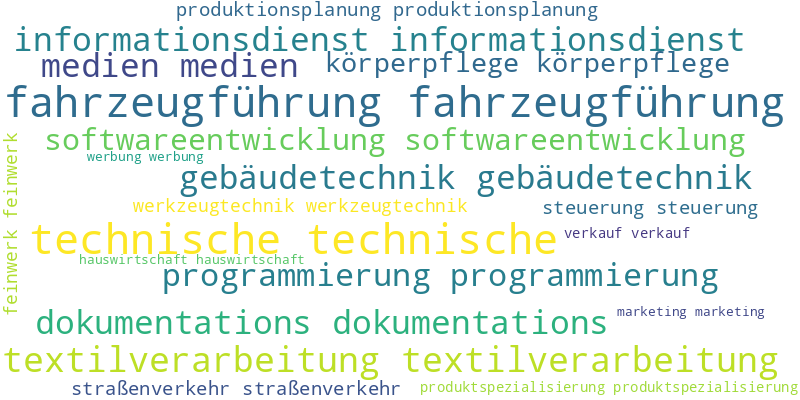


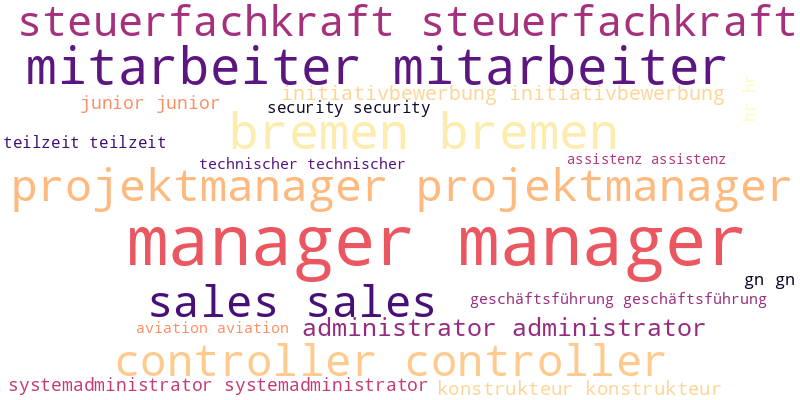
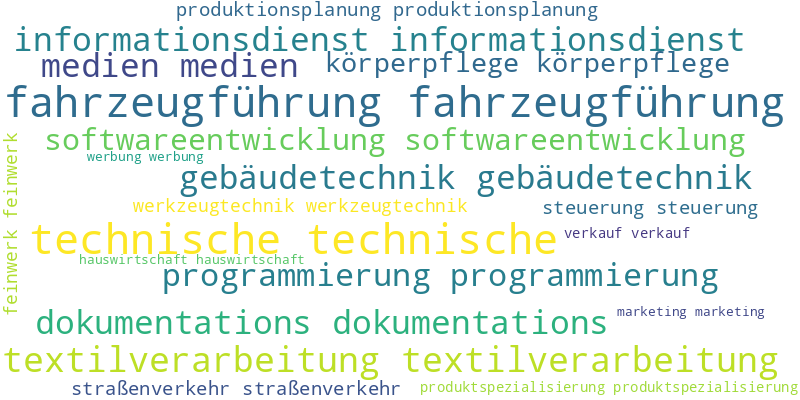

In [4]:
stop_words = set(nltk.corpus.stopwords.words("german")) | set(nltk.corpus.stopwords.words("english"))

available_jobs = json.load(open("jobs_in_bremen.json", "r"))
available_job_titles = []
for entry in available_jobs:
    available_job_titles.append(entry["job_title"].lower())

available_jobs_text = ""
tfidf_vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(stop_words=stop_words)
tfidf_matrix = tfidf_vectorizer.fit_transform(available_job_titles)
tfidf_scores = tfidf_matrix.toarray()
feature_names = tfidf_vectorizer.get_feature_names_out()
for i, position in enumerate(feature_names):
    job_tfidf_score = sum(tfidf_scores[:, i]) / len(tfidf_scores[:, i])
    available_jobs_text += " " + " ".join([position] * int(job_tfidf_score * 1000))
available_jobs_wc = wordcloud.WordCloud(background_color="white", max_words= 20, 
                                        width=800, height=400, colormap="magma").generate(available_jobs_text)
available_jobs_wc.to_image()

needed_jobs_text = ""
df = pd.read_csv("job_seekers.csv")
needed_job_titles = df["Job Field"]
tfidf_vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(stop_words=stop_words)
tfidf_matrix = tfidf_vectorizer.fit_transform(needed_job_titles)
tfidf_scores = tfidf_matrix.toarray()
feature_names = tfidf_vectorizer.get_feature_names_out()
for i, position in enumerate(feature_names):
    job_tfidf_score = sum(tfidf_scores[:, i]) / len(tfidf_scores[:, i])
    needed_jobs_text += " " + " ".join([position] * int(job_tfidf_score * 1000))
needed_jobs_wc = wordcloud.WordCloud(background_color="white", max_words= 20, 
                                     width=800, height=400).generate(needed_jobs_text)
needed_jobs_wc.to_image()

md = f"### We should address the gap by matching available jobs and job seekers' preferences."
IPython.display.display(IPython.display.Markdown(md))
ipyplot.plot_images([available_jobs_wc.to_image(), needed_jobs_wc.to_image()], 
                    ["Top Available Jobs in the Current Market", "Top Job Seekers' Preferred Careers"],
                    max_images=20, img_width=400)

## Summary
- **Data science** can **support policymakers** to make **data-driven decisions.**
- We **collected and analyzed online data** about the **unemployment rate in Germany.**
- We identified a **high unemployment rate in Bremen** that needs immediate action.
- We used **natural language processing and artificial intelligence algorithms** to **recommend government address the job market issue** in Bremen.